In [5]:
import json
import glob
import os
import argparse
from pathlib import Path

import imgaug.augmentables as ia
import imgaug.augmenters as iaa
import albumentations as A

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

import torchvision as tv
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch

import pytorch_lightning as pl
from pytorch_lightning.loggers import NeptuneLogger
from pytorch_lightning.callbacks import ModelCheckpoint

# Types
from typing import List, Tuple, Optional
import dataclasses
from pydantic.dataclasses import dataclass as pydantic_dataclass
from pydantic import validate_arguments, Field
from pydantic import PositiveInt, PositiveFloat, confloat
from pydantic import FilePath, DirectoryPath

# Mine
from effdet.east import EfficientDetDoesEAST, decode, resizer, EASTLoss
from effdet.east.losses import DiceLoss
# from datasets.coco_text.dataset import COCO_Text, COCOTextDataset

# Visualization Utils

In [6]:
def eastmask_to_image(image, emask, scale=4, ths=0.5, nms=0.01):
    xyxy = decode(emask, scale=scale, threshold=ths, nms_iou=nms)
    image = (image + 1)/2.
    if xyxy is not None:
        # bboxes and resize
        image = image.permute(1,2,0)
        bboxes = ia.BoundingBoxesOnImage.from_xyxy_array(xyxy.cpu().numpy(), shape=image.shape)
        bboxes = resizer(bboxes=bboxes, size=image.shape[:-1])
        image = tv.transforms.ToTensor()(bboxes.draw_on_image(image, color=(0,255,0), size=10))
    return image

In [7]:
def grid_from_batch(images, emasks, scale=4, ths=0.5, nms=0.01):
    imgs = []
    for img, em in zip(images, emasks):
        imgd = eastmask_to_image(img, em, scale=scale, ths=ths, nms=nms)
        imgs.append(imgd)
    grid = torch.stack(imgs)
    grid = tv.utils.make_grid(grid)
    return grid

# DataModule

In [8]:
@pydantic_dataclass
class COCOTextDataModule(pl.LightningDataModule):
    
    annotation_file: FilePath = dataclasses.field(metadata="location of annotation file")
    images_dir: DirectoryPath = dataclasses.field(metadata="location of images")
    image_size: Tuple[PositiveInt, PositiveInt] = dataclasses.field(default=(768,768), metadata="(h,w) of images")
    scale: PositiveInt = dataclasses.field(default=4, metadata="Relative scale of the mask => (h/scale, w/scale)")
    train_bs: PositiveInt = dataclasses.field(default=4, metadata="Training batch size")
    valid_bs: PositiveInt = dataclasses.field(default=4, metadata="Eval batch size")
    num_workers: PositiveInt = dataclasses.field(default=2)
    val_pct: confloat(gt=.0, lt=1.0) = dataclasses.field(default=0.1, metadata="Percentage of data to use for validation")
    

    def __post_init_post_parse__(self,):
        super().__init__()
        self.ct = COCO_Text(self.annotation_file)
        self.img_ids = sorted(self.ct.getImgIds(imgIds=self.ct.train, catIds=[('legibility','legible'),('class','machine printed')]))
        
    def train_augs(self,):
        return iaa.Sequential([
            iaa.HorizontalFlip(0.5),
            iaa.VerticalFlip(0.5),
            iaa.OneOf([
                iaa.MultiplyAndAddToBrightness(mul=(0.5, 1.5), add=(-30, 30)),
                iaa.Noop()
            ]),
            iaa.OneOf([
                iaa.Grayscale(alpha=(0.0, 1.0)),
                iaa.Noop()
            ]),
            iaa.OneOf([
                iaa.Noop(),
                iaa.GammaContrast((0.5, 1.0))
            ]),
            iaa.Affine(
                scale={"x": (0.9, 1.1), "y": (0.9, 1.1)},
                translate_percent={"x": (-0.05, 0.05), "y": (-0.05, 0.05)},
                rotate=(-5, 5),
                cval=255,
            ),
        ])

    def setup(self, stage):
        if stage == 'fit':
            train_size = round(len(self.img_ids) * (1. - self.val_pct))
            self.train_dataset = COCOTextDataset(self.img_ids[:train_size], 
                                                 self.images_dir,
                                                 ct=self.ct,
                                                 image_size=self.image_size,
                                                 scale=self.scale,
                                                 transforms=self.train_augs())
            self.valid_dataset = COCOTextDataset(self.img_ids[train_size:], 
                                                 self.images_dir,
                                                 ct=self.ct,
                                                 image_size=self.image_size,
                                                 scale=self.scale)
        if stage == 'test':
            self.test_dataset = self.valid_dataset

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.train_bs, shuffle=True, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.valid_dataset, batch_size=self.valid_bs, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.valid_bs, num_workers=self.num_workers)

AttributeError: 'str' object has no attribute 'items'

In [5]:
datamodule = COCOTextDataModule('COCO/COCO_Text.json', 'COCO/train2014/', train_bs=16, valid_bs=4)

loading annotations into memory...
0:00:01.371822
creating index...
index created!


In [6]:
datamodule.setup('fit')

In [7]:
dl_iter = iter(datamodule.val_dataloader())

In [8]:
x, y = next(dl_iter)

In [9]:
x.shape, y.shape

(torch.Size([4, 3, 768, 768]), torch.Size([4, 5, 192, 192]))

In [10]:
image_drawn = grid_from_batch(x, y, nms=0.001)

/home/Aula11/another_efficientdet_public/effdet/east/utils.py:93: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple) (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629403081/work/torch/csrc/utils/python_arg_parser.cpp:766.)
  nz_coords = torch.nonzero(pred_image[0] > threshold)


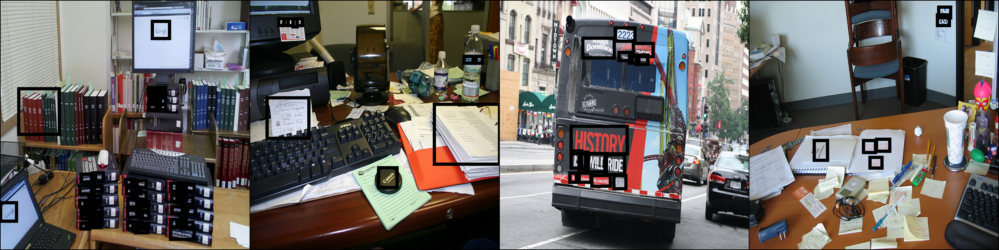

In [11]:
tv.transforms.ToPILImage()(image_drawn)

# Model

In [42]:
ckpt = torch.load('ArTCkps/TD18-ArT-effdet-epoch=19-val_loss=0.1330.ckpt')['state_dict']

In [53]:
model = nn.Module()

In [54]:
model.model = EfficientDetDoesEAST(
    advprop=True,
    compound_coef=6,
)

Loaded pretrained weights for efficientnet-b6


In [55]:
model.load_state_dict(ckpt)

<All keys matched successfully>

In [56]:
optimizer = torch.optim.Adam(model.model.parameters(), lr=1e-4)
loss_fn = EASTLoss(iou_weight=0.1)

In [57]:
datamodule = COCOTextDataModule('COCO/COCO_Text.json', 'COCO/train2014/', train_bs=4, valid_bs=4)

loading annotations into memory...
0:00:01.213542
creating index...
index created!


In [58]:
datamodule.setup('fit')

In [59]:
x, y = next(iter(datamodule.train_dataloader()))
x.shape, y.shape

(torch.Size([4, 3, 768, 768]), torch.Size([4, 5, 192, 192]))

In [60]:
_ = model.model.backbone.backbone_net.requires_grad_(False)

In [61]:
_ = model.cuda()

In [62]:
for _ in range(500):
    model.train()
    model.model.backbone.freeze_bn()
    
    
    model.zero_grad()
    
    scores = model.model(x.cuda())
    loss, _ = loss_fn(y.float().cuda(), scores)
    
    loss.backward()
    optimizer.step()
    
    print(loss)

tensor(5.3231, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.2826, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.2641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.2359, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.2025, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.1716, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.1170, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.0814, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.0219, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.9791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.9230, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.8654, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.8216, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.7321, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.6453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.5659, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.4453, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.3035, device='cuda:0', grad_fn=<AddBack

tensor(0.8085, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7618, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.8000, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7763, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7417, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7065, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7007, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7112, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7049, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7441, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6945, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.7042, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6939, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6950, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6878, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6897, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.6787, device='cuda:0', grad_fn=<AddBack

tensor(0.5641, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5644, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5701, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5694, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5763, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5597, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5682, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5676, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5589, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5616, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5619, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5697, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5594, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5577, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5508, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5560, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5590, device='cuda:0', grad_fn=<AddBack

tensor(0.5171, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5418, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5149, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5157, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5195, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5344, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5288, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5209, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5150, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5174, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5198, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5128, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.5126, device='cuda:0', grad_fn=<AddBack

In [63]:
model.eval()
with torch.no_grad():
    scores = model.model(x.cuda())

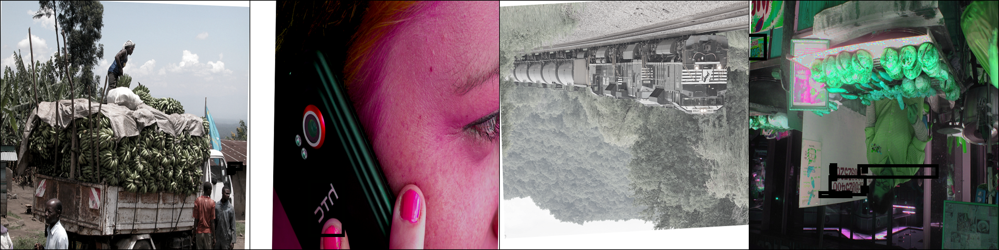

In [64]:
grid = grid_from_batch(x, scores, nms=0.0001, ths=0.8)
tv.transforms.ToPILImage()(grid)

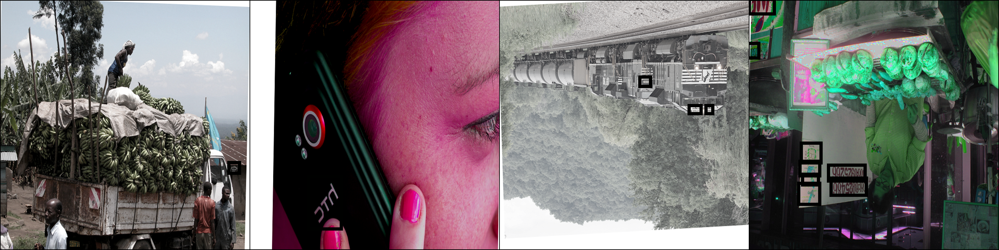

In [65]:
grid = grid_from_batch(x, y, nms=0.0001, ths=0.8)
tv.transforms.ToPILImage()(grid)